In [ ]:
!pip install ultralytics --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 52.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 106.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 90.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 62.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 91.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [ ]:
from ultralytics import YOLO
import ultralytics
ultralytics.checks()

Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.4/107.7 GB disk)


In [ ]:
import zipfile
with zipfile.ZipFile('car_dataset.zip', 'r') as zip_ref:
    zip_ref.extractall('car_dataset')

In [ ]:
# prompt: extract traffic-signs.zip directly in content
with zipfile.ZipFile('traffic-signs.zip', 'r') as zip_ref:
    zip_ref.extractall('content')

In [ ]:
model = YOLO("yolov8n.pt")  # You can also try yolov8s.pt
# Train the model
model.train(
    data="/content/car_dataset/car/data.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    project="traffic-signs",
    name="yolov8n",
    exist_ok=True
)

In [ ]:
model.val()

NameError: name 'model' is not defined

In [ ]:
metrics = model.val()

# Summary
print(f"mAP@0.5: {metrics.box.map50:.2%}\n")

# Per-class mAP
print("Per-Class mAP:")
for i, m in enumerate(metrics.box.maps):
    print(f"{model.names[i]}: {m:.2%}")

# Best/Worst Classes
import numpy as np
most_idx = np.argmax(metrics.box.maps)
least_idx = np.argmin(metrics.box.maps)

print(f"\n✅ Most Accurate Class: {model.names[most_idx]} ({metrics.box.maps[most_idx]:.2%})")
print(f"❌ Least Accurate Class: {model.names[least_idx]} ({metrics.box.maps[least_idx]:.2%})")


Ultralytics 8.3.140 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 624.1±194.6 MB/s, size: 19.5 KB)


val: Scanning /content/car_dataset/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  6.24it/s]


                   all        801        944      0.962       0.92      0.966      0.839
           Green Light         87        122      0.901      0.721      0.858      0.536
             Red Light         74        108      0.869      0.739       0.84      0.528
       Speed Limit 100         52         52          1      0.999      0.995      0.893
       Speed Limit 110         17         17      0.948      0.941      0.975      0.888
       Speed Limit 120         60         60      0.996          1      0.995      0.924
        Speed Limit 20         56         56      0.935      0.982      0.985      0.869
        Speed Limit 30         71         74      0.961      0.959      0.991      0.934
        Speed Limit 40         53         55      0.967      0.982      0.992      0.896
        Speed Limit 50         68         71          1      0.886      0.982       0.88
        Speed Limit 60         76         76      0.953      0.934      0.972      0.887
        Speed Limit 7

Results saved to runs/detect/predict2


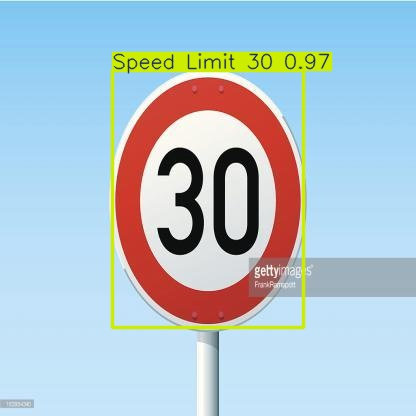

In [ ]:
# Run prediction on a test image
results = model.predict(
    source="/content/car_dataset/car/test/images/000003_jpg.rf.8511b9c219dbf9799a6d58900b15917d.jpg",
    save=True,
    conf=0.25
)

# Display the predicted image
from IPython.display import Image, display
import glob

# Update the path based on where YOLO saved the output

predicted = "/content/traffic-signs/yolov8n/000003_jpg.rf.8511b9c219dbf9799a6d58900b15917d.jpg"
display(Image("/content/runs/detect/predict2/000003_jpg.rf.8511b9c219dbf9799a6d58900b15917d.jpg"))


In [ ]:
import os
from ultralytics import YOLO
from IPython.display import Image, display
import glob
from shutil import copyfile

# Load your trained model
model = YOLO('/content/traffic-signs/yolov8n/weights/best.pt')

# Define paths
input_folder = '/content/car_dataset/car/test/images'
output_folder = '/content/traffic-signs/predictions'

# Run prediction on entire folder
results = model.predict(
    source=input_folder,
    save=True,
    save_txt=False,
    conf=0.25,
    name='predictions',        # YOLO will create this inside /runs/detect/
    project='/content/traffic-signs'
)


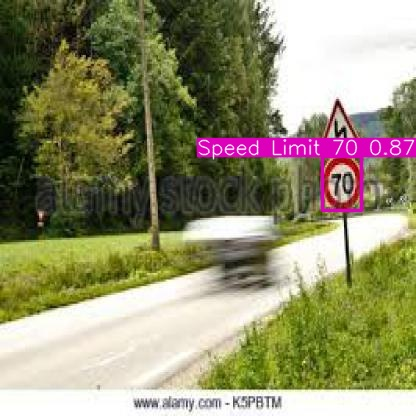

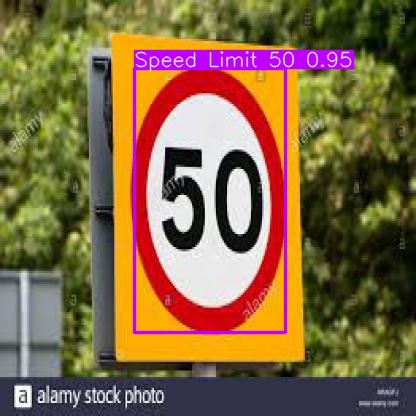

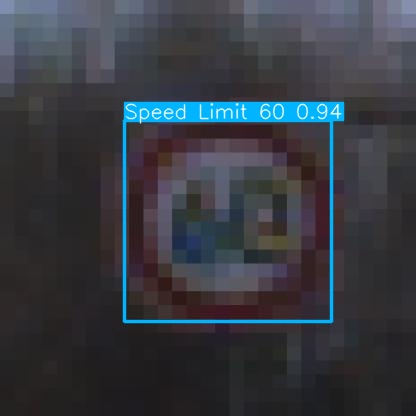

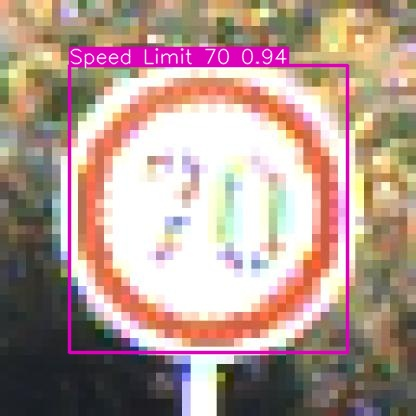

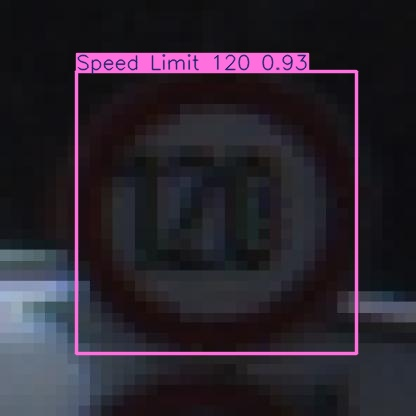

In [ ]:
# Show one or more output images
predicted_images = glob.glob('/content/traffic-signs/predictions/*.jpg')

# Display first 5 predicted images
for img_path in predicted_images[:5]:
    display(Image(filename=img_path))


In [ ]:
import cv2
import time
from ultralytics import YOLO
from IPython.display import Video, display

# Load trained YOLO model
model = YOLO("/content/traffic-signs/yolov8n/weights/best.pt")

# Input/output video paths
video_path = '/content/car_dataset/video.mp4'
output_path = 'output_detection_video_with_fps.mp4'

# Open the video
cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print(f"❌ Error: Could not open video file {video_path}")
else:
    # Get properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    total_frames = 0
    total_time = 0

    print("🚀 Processing video with FPS overlay...")
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        start = time.time()
        results = model.predict(source=frame, conf=0.25, verbose=False)
        end = time.time()

        total_frames += 1
        frame_time = end - start
        total_time += frame_time

        # Draw predictions
        annotated = results[0].plot()

        # ✅ Add FPS overlay on top-left corner
        fps_text = f"{1 / frame_time:.2f} FPS"
        cv2.putText(annotated, fps_text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 255), 2)

        # Write to output video
        out.write(annotated)

    cap.release()
    out.release()

    # Summary
    if total_frames > 0:
        avg_fps = total_frames / total_time
        print(f"\n✅ Detection Completed!")
        print(f"Total frames: {total_frames}")
        print(f"Total time: {total_time:.2f}s")
        print(f"Average FPS: {avg_fps:.2f}")
        print(f"Saved to: {output_path}")

        # Show the output video
        display(Video(output_path, embed=True, html_attributes='controls loop'))
    else:
        print("⚠️ No frames processed. Check video integrity.")


🚀 Processing video with FPS overlay...

✅ Detection Completed!
Total frames: 508
Total time: 5.46s
Average FPS: 93.06
Saved to: output_detection_video_with_fps.mp4


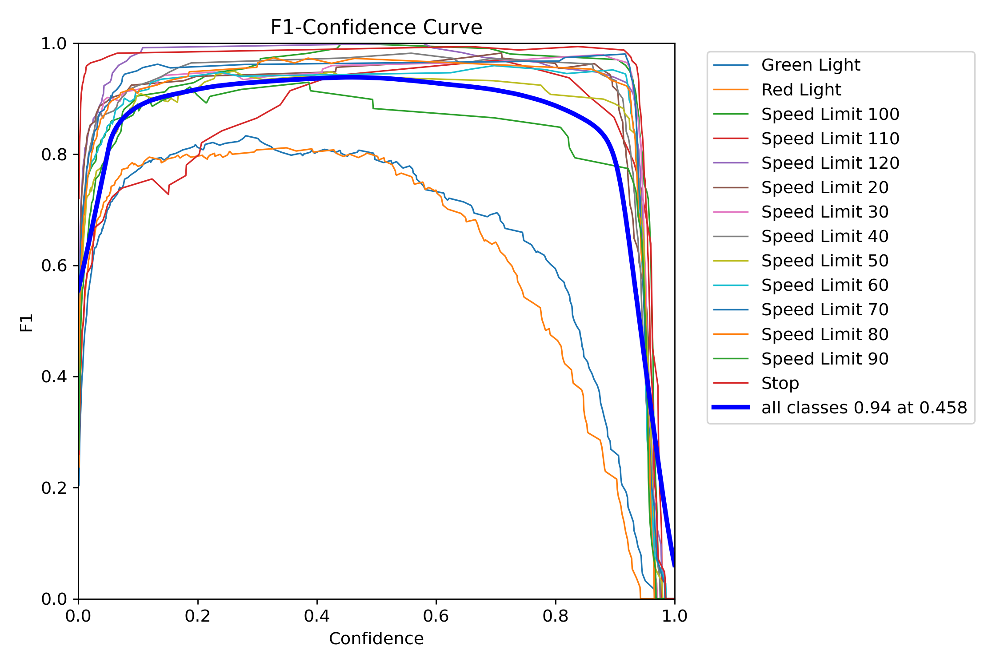

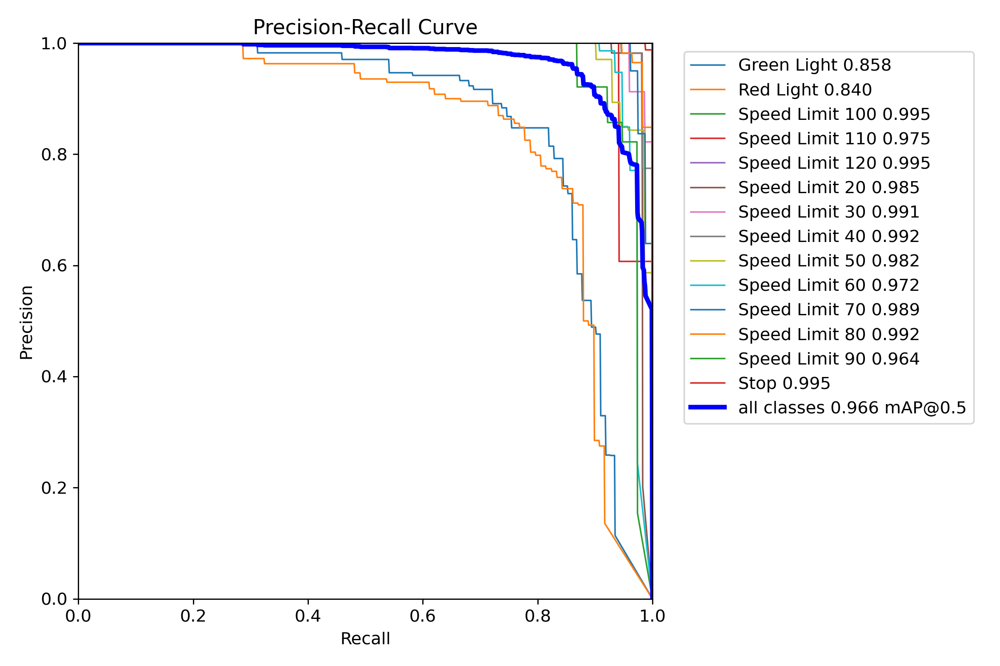

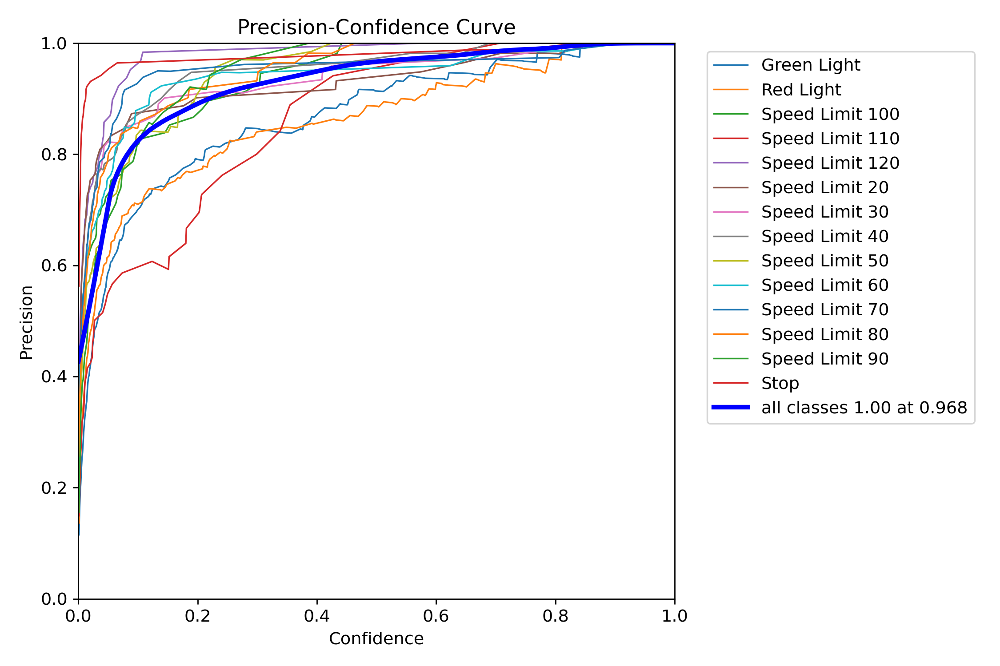

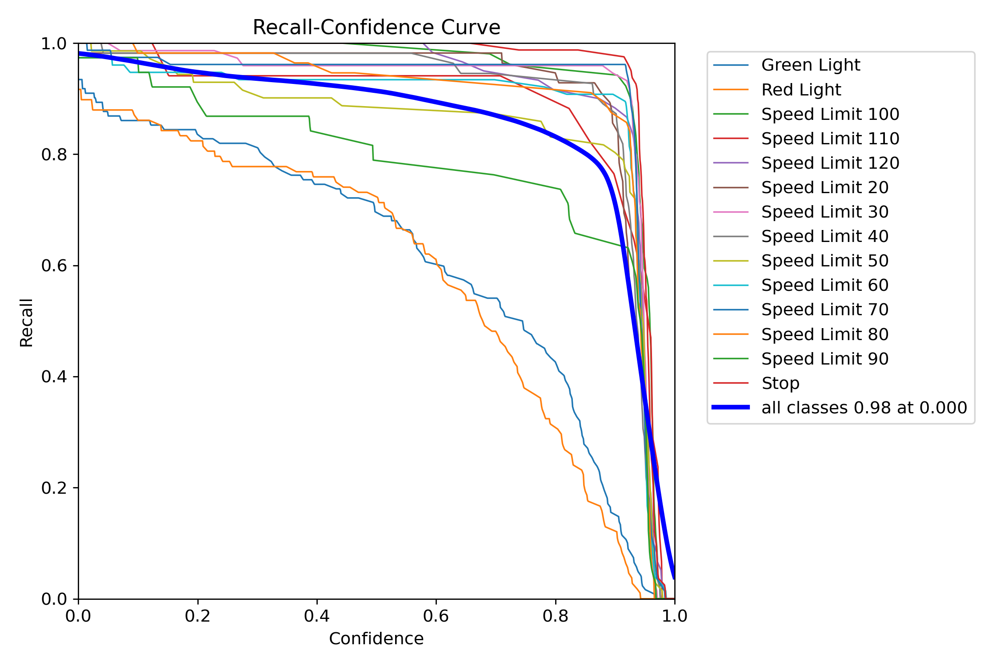

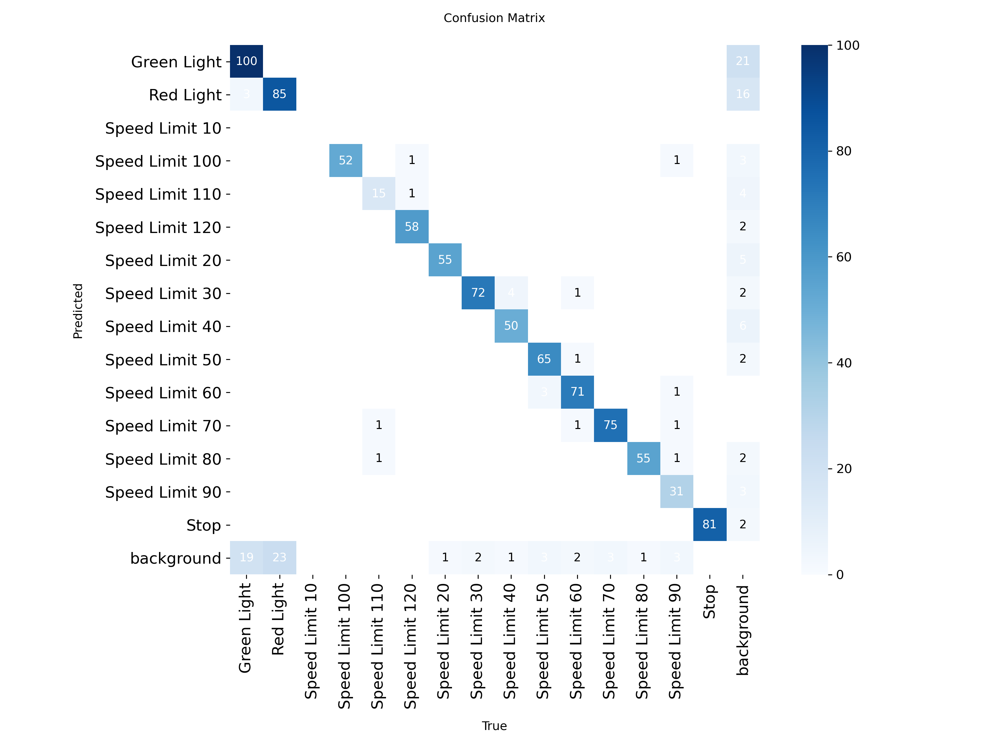

In [ ]:
display(Image("/content/traffic-signs/yolov8n/F1_curve.png"))
display(Image("/content/traffic-signs/yolov8n/PR_curve.png"))
display(Image("/content/traffic-signs/yolov8n/P_curve.png"))
display(Image("/content/traffic-signs/yolov8n/R_curve.png"))
display(Image("/content/traffic-signs/yolov8n/confusion_matrix.png"))

In [ ]:
!pip install  deep_sort_realtime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 90.2 MB/s eta 0:00:00


In [ ]:
!pip install opencv-python-headless

In [ ]:
# prompt: I want to detect persons putting bounding box on them, also detect stop signs and put bounding box on them, if the stop sign is inside a person bounding box write fake stop sign on it, use the video from /content/videoplayback.mp4, and for the stop sign detection use /content/traffic-sign/weights/best.pt

# Install required libraries if not already installed

import cv2
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort
import numpy as np
from IPython.display import Video, display
import time

# Load the YOLO models
# Using pre-trained YOLOv8n for person detection
person_model = YOLO("yolov8n.pt")
# Using the custom trained model for stop sign detection
stop_sign_model = YOLO("/content/traffic-signs/weights/best.pt") # Corrected path based on your training

# Initialize DeepSort tracker (optional, but useful for consistent person IDs across frames)
tracker = DeepSort(max_age=30, n_init=2)

# Define video paths
video_path = '/content/videoplayback.mp4'
output_path = 'output_person_stop_sign_detection.mp4'

# Open the video
cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print(f"❌ Error: Could not open video file {video_path}")
else:
    # Get video properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    print("🚀 Processing video for person and stop sign detection...")
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        start = time.time()

        # Detect persons using the pre-trained model
        person_results = person_model.predict(source=frame, classes=[0], conf=0.5, verbose=False) # Class 0 is 'person' in COCO dataset

        # Detect stop signs using the custom trained model
        stop_sign_results = stop_sign_model.predict(source=frame, conf=0.5, verbose=False) # Assuming stop sign is detected with this model

        # Extract bounding boxes and class names for persons
        person_detections = []
        person_boxes = []
        if person_results[0] and person_results[0].boxes:
            for box in person_results[0].boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
                conf = box.conf[0].item()
                cls = int(box.cls[0].item())
                person_boxes.append((x1, y1, x2, y2))
                person_detections.append(([x1, y1, x2-x1, y2-y1], conf, person_model.names[cls])) # Format for DeepSort

        # Update tracker with person detections
        tracks = tracker.update_tracks(person_detections, frame=frame)

        # Extract bounding boxes and class names for stop signs
        stop_sign_boxes = []
        if stop_sign_results[0] and stop_sign_results[0].boxes:
             for box in stop_sign_results[0].boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
                stop_sign_boxes.append((x1, y1, x2, y2))

        # Draw bounding boxes and labels on the frame
        annotated_frame = frame.copy()

        # Draw person boxes and IDs (from tracker)
        for track in tracks:
            if not track.is_confirmed():
                continue
            track_id = track.track_id
            ltrb = track.to_ltrb()
            x1, y1, x2, y2 = map(int, ltrb)
            cv2.rectangle(annotated_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(annotated_frame, f"Person-{track_id}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # Draw stop sign boxes and check for overlap with person boxes
        for ss_x1, ss_y1, ss_x2, ss_y2 in stop_sign_boxes:
            is_inside_person = False
            for p_x1, p_y1, p_x2, p_y2 in person_boxes:
                 # Check if the center of the stop sign is within the person bounding box
                 ss_center_x = (ss_x1 + ss_x2) // 2
                 ss_center_y = (ss_y1 + ss_y2) // 2
                 if p_x1 < ss_center_x < p_x2 and p_y1 < ss_center_y < p_y2:
                    is_inside_person = True
                    break # Found a person bounding box containing the stop sign

            if is_inside_person:
                cv2.rectangle(annotated_frame, (ss_x1, ss_y1), (ss_x2, ss_y2), (0, 0, 255), 2) # Red box for fake stop sign
                cv2.putText(annotated_frame, "Fake Stop Sign", (ss_x1, ss_y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
            else:
                cv2.rectangle(annotated_frame, (ss_x1, ss_y1), (ss_x2, ss_y2), (255, 0, 0), 2) # Blue box for real stop sign
                cv2.putText(annotated_frame, "Stop Sign", (ss_x1, ss_y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)


        end = time.time()
        frame_time = end - start
        fps_text = f"{1 / frame_time:.2f} FPS"
        cv2.putText(annotated_frame, fps_text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 255), 2)


        # Write the annotated frame to the output video
        out.write(annotated_frame)

    cap.release()
    out.release()

    print(f"\n✅ Detection Completed!")
    print(f"Saved to: {output_path}")

    # Show the output video
    display(Video(output_path, embed=True, html_attributes='controls loop'))

